## Visualize FAS maps of SFBA

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pygmt

In [2]:
def KO98_smoothing(freq, y, bexp):
    nx = len(freq)
    ysmooth = np.zeros_like(y)
    max_ratio = 10 ** (3 / bexp)
    min_ratio = 1 / max_ratio
    for ix in range(nx):
        fc = freq[ix]
        if fc < 1e-6:
            ysmooth[ix] = 0
        total = 0
        window_total = 0
        for jj in range(nx):
            frat = freq[jj] / fc
            if freq[jj] < 1e-6 or frat > max_ratio or frat < min_ratio:
                continue  # skip
            elif abs(freq[jj] - fc) < 1e-6:
                window = 1
            else:
                x = bexp * np.log10(frat)
                window = (np.sin(x) / x) ** 4

            total += window * y[jj]
            window_total += window

        if window_total > 0:
            ysmooth[ix] = total / window_total
        else:
            ysmooth[ix] = 0

    return ysmooth

In [ ]:
fass = []
for tcondvar in [2, 5]:
    d = np.load(f'./wfs_{tcondvar}.npy')
    num_data = d.shape[0]
    L_signal = d.shape[1]
    Fs = 100
    delta_t = 0.01
    frequency_vector = np.arange(-L_signal/2, L_signal/2) /L_signal * Fs # 778*6942
    indices_one_sided = np.argwhere(np.logical_and(frequency_vector>=2, frequency_vector<=15)).squeeze()
    hz_idx = [np.argwhere(frequency_vector[indices_one_sided] >= hz)[0].item() for hz in [2, 5, 10, 15]]
    fft_loop = np.fft.fft(d)
    fft_loop_abs = np.fft.fftshift(np.abs(fft_loop), axes=-1)
    Fourier_Amplitude_Array_proper_pred = fft_loop_abs[:, indices_one_sided]*delta_t
    ground_truth_selected_FAS =  KO98_smoothing(frequency_vector[indices_one_sided],  Fourier_Amplitude_Array_proper_pred.T, 20)
    fass.append(ground_truth_selected_FAS)

In [ ]:
hz_gen = 478 # index for 10 Hz (frequency vector)

In [ ]:
# load data for three FAS maps
gen_fas_map_baseline = np.log(fass[1][[hz_gen], :])
gen_fas_map = np.log(fass[0][[hz_gen], :])
non_erg_gmm = np.load('non_erg_gmm.npy') # Non-ergodic GMM model using GP

print('the max value is: ', np.max([gen_fas_map_baseline.max(), gen_fas_map.max(), non_erg_gmm.max()]))
print('the min value is: ', np.min([gen_fas_map_baseline.min(), gen_fas_map.min(), non_erg_gmm.min()]))

print('the max value is: ', np.max([gen_fas_map.max(), non_erg_gmm.max()]))
print('the min value is: ', np.min([gen_fas_map.min(), non_erg_gmm.min()]))

the max value is:  -7.743188203272648
the min value is:  -12.358787536621094
the max value is:  -7.743188203272648
the min value is:  -12.358787536621094


Loading coordinates for specific area in SFBA

In [6]:
lon = np.load('lon.npy')
lat = np.load('lat.npy')

In [7]:
import pygmt
region = [ -122.503491204439, -121.8, 37.2661695985203, 38.066565827788]
grid = pygmt.datasets.load_earth_relief(resolution="01s", region=region)

In [8]:
grid.shape

(2896, 2536)

## Plot non-ergodic GMM, CGM-baseline, CGM-GM

In [9]:
station_lon = np.load('station_lon.npy')
station_lat = np.load('station_lat.npy')

makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)
makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)
makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)


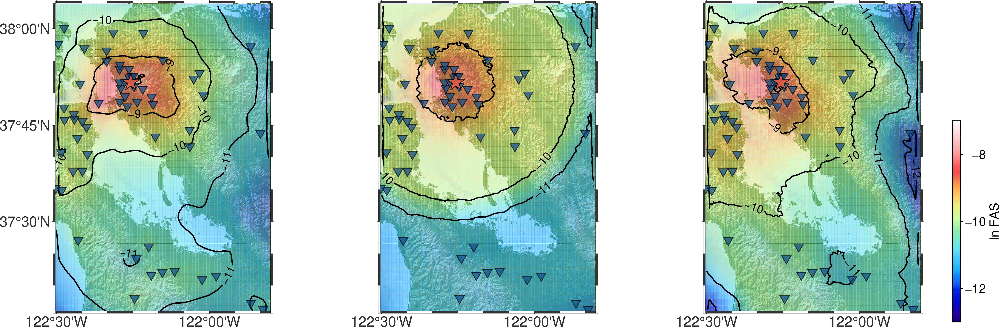

In [ ]:
fig = pygmt.Figure()
pygmt.config(FONT_TITLE="1c", FONT_ANNOT="0.8c", FONT_LABEL="0.8c", FONT_ANNOT_PRIMARY="0.8c", FONT_ANNOT_SECONDARY="0.8c")
with fig.subplot(
    nrows=1,
    ncols=3,
    figsize=("54c", "14c"), # 54c, 14c
    autolabel=False,
    margins=["0.1c", "0.5c"],
    # title="My Subplot Heading",
    sharex="b",  # shared x-axis on the bottom side
    sharey="l",  # shared y-axis on the left side
    frame="WSrt",
):

    diffs = [non_erg_gmm, gen_fas_map_baseline.squeeze(), gen_fas_map.squeeze()]
    for col in range(3):
        with fig.set_panel(panel=col):
            frame = ['xa0.5f', 'yaf']
            
            fig.grdimage(grid=grid, cmap="oleron", shading=True, transparency=20, projection="M12c", frame=frame)
            
            diff = diffs[col]

            if type(diff) is not np.ndarray:
                diff = diff.to_numpy()
            
            
            pygmt.makecpt(series=[-13, -7.0], cmap="haxby", continuous=True)
            
            fig.plot(
                    x=lon, 
                    y=lat, 
                    projection="M12c",
                    style="s0.26", 
                    fill=diff,
                    cmap=True,
                    transparency=50, 
                )

            sorted_x_idx = np.argsort(lon.tolist())
            
            moving_diff = [diff[0]] + [(diff[i] + diff[i+1] + diff[i+2]) / 3 for i in range(0, len(diff)-2)] + [diff[-1]]
            moving_diff = np.asarray(moving_diff)[sorted_x_idx]
            
            fig.contour(
                    region=region,
                    projection="M12c",
                    pen="2p",
                    x=lon[sorted_x_idx].tolist(), 
                    y=lat[sorted_x_idx].tolist(), 
                    z=moving_diff,
                    levels=1,
                    annotation="1+f18p",
                )
            
            # stations
            fig.plot(
                    x=station_lon,
                    y=station_lat,        
                    projection="M12c",
                    style= "i0.6c", # "c0.4c", "t0.6c"
                    fill='dodgerblue4', # 'dimgray', "royalblue"
                    pen='1p,black',
                    # pen="1p,slategray",
                    cmap=False,
                    transparency=30,  # set transparency level for all symbols
                )
            
            # source
            fig.plot(
                    x=-122.25667,
                    y=37.86083,
                    projection="M12c",
                    style="a1.0c", #a1.0c
                    # fill='black',
                    fill='tomato', # 'skyblue', "black"
                    pen= '1p,black', #"1p,slategray",
                    transparency=20, 
                )

            # Add colorbar legend
            if col == 2:
                fig.colorbar(frame="a2x+lln FAS" , position="JRM+o0c/-2c")  #

fig.show()